In [1]:
#import os
#os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"   # see issue #152
#os.environ["CUDA_VISIBLE_DEVICES"] = ""

In [2]:
from keras import backend as K
from keras.models import load_model
from keras.preprocessing import image
from keras.optimizers import Adam
from imageio import imread
import numpy as np
import matplotlib.patches as patches
from matplotlib import pyplot as plt

from keras_loss_function.keras_ssd_loss import SSDLoss
from keras_layers.keras_layer_AnchorBoxes import AnchorBoxes
from keras_layers.keras_layer_DecodeDetections import DecodeDetections
from keras_layers.keras_layer_DecodeDetectionsFast import DecodeDetectionsFast
from keras_layers.keras_layer_L2Normalization import L2Normalization

from ssd_encoder_decoder.ssd_output_decoder import decode_detections, decode_detections_fast

from data_generator.object_detection_2d_data_generator import DataGenerator
from data_generator.object_detection_2d_photometric_ops import ConvertTo3Channels
from data_generator.object_detection_2d_geometric_ops import Resize
from data_generator.object_detection_2d_misc_utils import apply_inverse_transforms

from extra_files import helper

%matplotlib inline

Using TensorFlow backend.
/home/aldo/Documents/ssd/data_generator/object_detection_2d_data_generator.py:43: UserWarning: 'BeautifulSoup' module is missing. The XML-parser will be unavailable.
  warnings.warn("'BeautifulSoup' module is missing. The XML-parser will be unavailable.")


In [3]:
def load_model_ssd300(path_model, 
                      size_model, 
                      num_classes, 
                      confidence, 
                      scales,
                      swap_channels,
                      mean_color,
                      divide_by_stddev,
                      steps,
                      iou,
                      alpha, 
                      expansion):
    '''
    Load model
    path_model: the path to the weights' model
    size_model: input size to the model
    num_classes: number of classes
    confidence: confidence use for nms
    scales: scales of default bounding boxes
    swap_channels: swap channels from input image
    mean_color: mean to rest from input image
    divide_by_stddev: number to divide input image
    steps: separations from each default box
    iou: iou use for nms
    alpha: controls the width of the network
    expansion: expansion on the inverted residual block from conv 13 on mobilenetv2
    '''
    
    # 1: Build the Keras model
    K.clear_session() # Clear previous models from memory.
    
    model = ssd_300(image_size=(size_model, size_model, 3),
                    n_classes=num_classes,
                    alpha = alpha,
                    expansion= expansion,
                    mode='inference',
                    scales=scales,
                    aspect_ratios_per_layer=[[1.0, 0.5, 2.0/3.0],
                                             [1.0, 0.5, 2.0/3.0, 1.0/3.0, 3.0/4.0],
                                             [1.0, 2.0, 0.5, 2.0/3.0, 1.0/3.0],
                                             [1.0, 2.0, 0.5, 2.0/3.0, 1.0/3.0],
                                             [1.0, 2.0, 0.5],
                                             [1.0, 2.0, 0.5]],
                    two_boxes_for_ar1=True,
                    steps=steps,
                    offsets=[0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
                    clip_boxes=False,
                    variances=[0.1, 0.1, 0.2, 0.2],
                    normalize_coords=True,
                    subtract_mean=mean_color,
                    divide_by_stddev=divide_by_stddev,
                    swap_channels=swap_channels,
                    confidence_thresh=confidence,
                    iou_threshold=iou,
                    top_k=200,
                    nms_max_output_size=400)

    # 2: Load the trained weights into the model.
    # TODO: Set the path of the trained weights.
    model.load_weights(path_model, by_name=True)

    # 3: Compile the model so that Keras won't complain the next time you load it.

    adam = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)

    ssd_loss = SSDLoss(neg_pos_ratio=3, alpha=1.0)

    model.compile(optimizer=adam, loss=ssd_loss.compute_loss)
    
    return model

In [4]:
def get_prediction(model, 
                   image):
    '''
    Load model
    model:keras model
    image:numpy array with shape (1, 320, 320, 3)
    return detections
    '''
    
    # Create variable to store predictions
    predictions = np.zeros(shape=(1, 200, 6))
    
    pred = model.predict(image)
    predictions = np.append(predictions, pred, axis=0)
    predictions = predictions[1:] # delete empty item

    clean_pre = helper.clean_predictions(predictions, id_class)
    adjust_pre = helper.adjust_predictions(clean_pre) 
    results = helper.get_coordinates(adjust_pre) 
    return results

In [5]:
import os
# Get all image names
img_names = os.listdir('../data-cic/preprocess_data/img_test/')

In [6]:
# Make predictions of the models
from models.keras_ssdlite320_mobilenetv2 import ssd_300

path_model = '../weights/models/tradeoff/ssdlite320_mobilenetv2_pascal_cic_1.0_exp_1.h5'
batch_size = 32
size_model = 320
num_classes = 1
scales = [0.15, 0.33, 0.47, 0.61, 0.76, 0.90, 1.05]
swap_channels = False
mean_color = [-1., -1., -1.]
id_class = 1
confidence = 0.20
divide_by_stddev = [127.5, 127.5, 127.5]
steps = [16, 32, 64, 107, 160, 320]
iou = 0.45
alpha = 1.0
expansion = 1

model = load_model_ssd300(path_model, 
                              size_model, 
                              num_classes, 
                              confidence, 
                              scales,
                              swap_channels,
                              mean_color,
                              divide_by_stddev,
                              steps,
                              iou,
                              alpha,
                              expansion)

In [7]:
import json

with open('/home/aldo/Documents/data-cic/via_region_data _final.json', 'r') as json_file:
    dict_json = json.load(json_file)
ground_truth_dict = helper.clean_dict(dict_json)

In [9]:
def cal_precision(to_eval, to_compare):
    '''
    Calculate the precision
    to_eval: cal precision for this item
    to_compare: item to compare with
    return: precision
    '''
    sum_iou = 0
    number_detection = 0
    for index_pred in range(len(to_eval)):
        number_detection += len(to_eval[index_pred])
        for item_to_eval in to_eval[index_pred]:
            best_match = helper.best_match(item_to_eval, to_compare[index_pred]) 
            sum_iou += best_match
            print(best_match)
    if number_detection == 0:
        return 0.0
    print('Boxes:', number_detection)
    return sum_iou / number_detection

## IOU
Intersection over Union is an evaluation metric used to measure the accuracy of an object detector on a particular dataset.

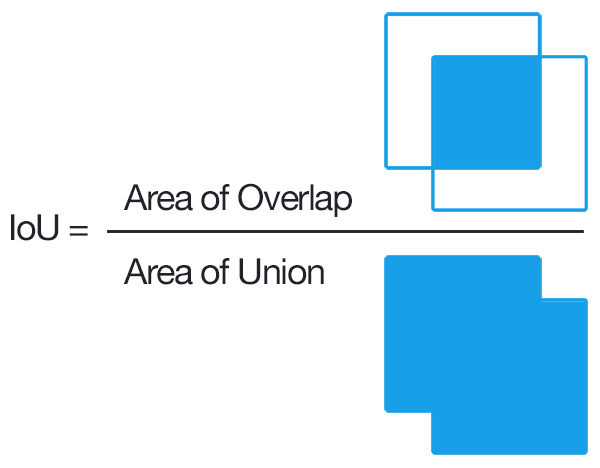

In [15]:
from IPython.display import Image
Image(filename='./examples/iou_equation.png')

Because it's very difficult to match exactly the prediction of our model with the ground truth, we need a evaluation metric that reward predictions with heavy overlapping wit the groun truth.

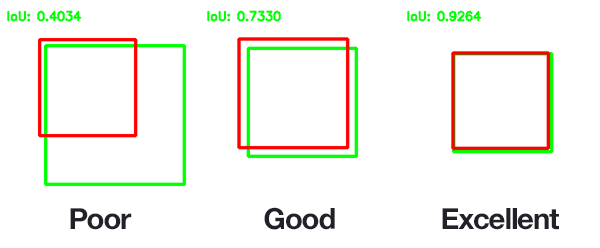

In [18]:
from IPython.display import Image
Image(filename='./examples/iou_examples.png')

## Precision
$P = \frac{VP}{VP + FP}$

$P(G,D) = \frac{\sum_{i=1}^{Img}\sum_{j=1}^{\left | D_{i} \right |}BestMatch(D_{i, j})}{\left | D \right |}$

$BestMatch(D_{i, j}) = max_{n}IOU(G_{i, n}, D_{i,j})$

## Recall
$R = \frac{VP}{VP + FN}$

$R(G,D) = \frac{\sum_{i=1}^{Img}\sum_{j=1}^{\left | G_{i} \right |}BestMatch(G_{i, j})}{\left | G \right |}$

$BestMatch(G_{i, j}) = max_{n}IOU(G_{i, j}, D_{i, n})$

## F1 score
$F_{1} = \frac{2PR}{P+R}$

In [21]:
from scipy import misc
import matplotlib.pyplot as plt
import time

sum_time = 0

global_pred = []
global_ground = []

for name_img in img_names[:1]:
    # Read image
    image = misc.imread('../data-cic/preprocess_data/img_test/' + name_img)
    
    height = image.shape[0]
    width = image.shape[1]
    
    image_test = misc.imresize(image, size=(320,320))
    image_test = image_test.reshape(1, 320, 320, 3)

    #start = time.time()
    predictions = get_prediction(model, image_test)
    predictions = helper.normilize_to_pixel(predictions, width, height)
    
    global_pred.append(predictions[0])

    ground_truth = []
    for value in ground_truth_dict[name_img]:
        label = value['shape_attributes']
        ground_truth.append([label['x'], label['y'], label['width'], label['height']])
        
    global_ground.append(ground_truth)

/home/aldo/anaconda3/envs/test2/lib/python3.6/site-packages/ipykernel_launcher.py:12: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  if sys.path[0] == '':
/home/aldo/anaconda3/envs/test2/lib/python3.6/site-packages/ipykernel_launcher.py:17: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


In [41]:
print(predictions)
print(ground_truth)

[[[709.0, 711.0, 151.0, 311.0], [237.0, 706.0, 111.0, 358.0]]]
[[220, 708, 150, 350], [709, 708, 142, 328], [628, 702, 144, 273]]


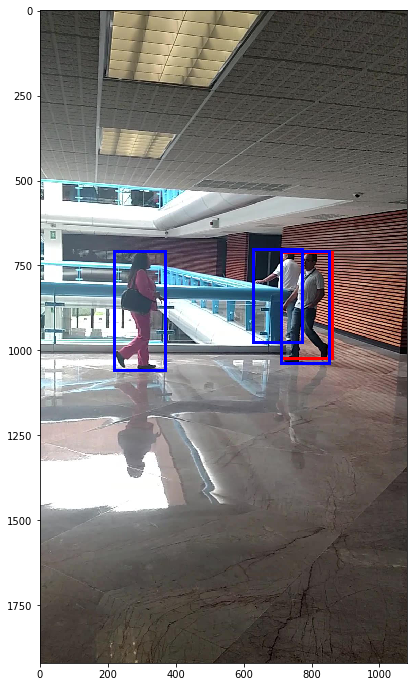

In [42]:
#helper.show_image_bb_2(image, [predictions[0][0]], [ground_truth[1]])
helper.show_image_bb_2(image, [predictions[0][0]], ground_truth)

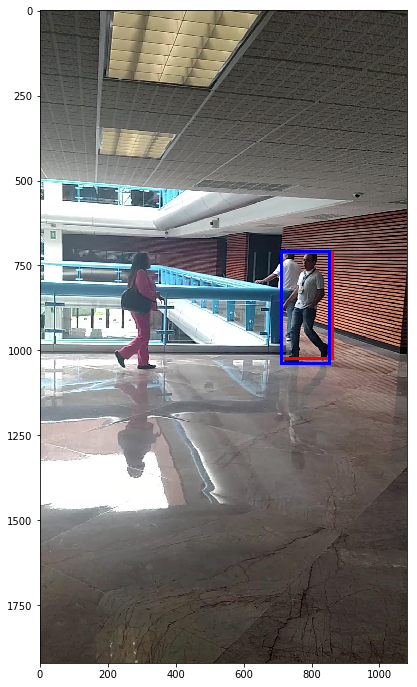

In [43]:
helper.show_image_bb_2(image, [predictions[0][0]], [ground_truth[1]])

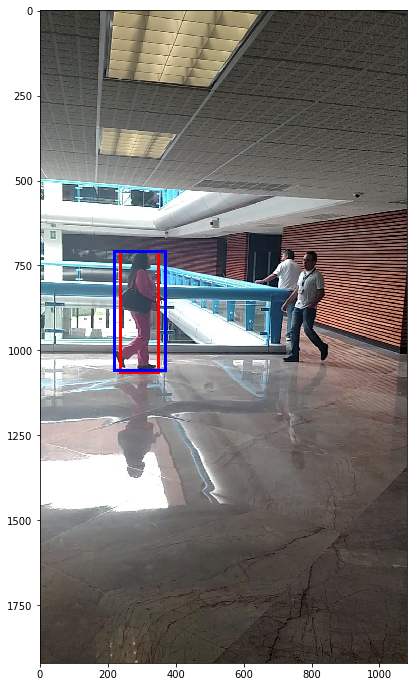

In [44]:
helper.show_image_bb_2(image, [predictions[0][1]], [ground_truth[0]])

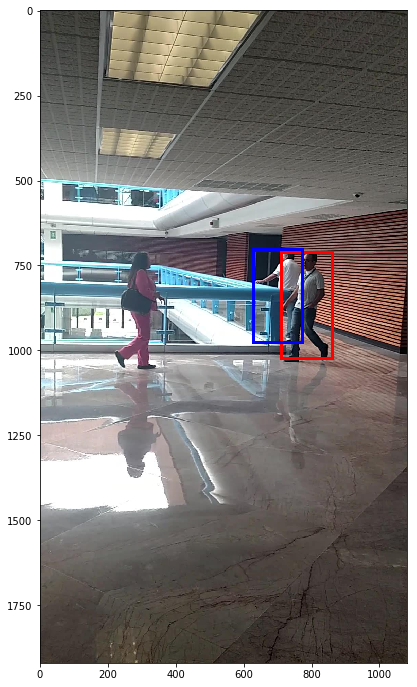

In [47]:
helper.show_image_bb_2(image, [predictions[0][0]], [ground_truth[2]])

/home/aldo/anaconda3/envs/test2/lib/python3.6/site-packages/ipykernel_launcher.py:13: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  del sys.path[0]
/home/aldo/anaconda3/envs/test2/lib/python3.6/site-packages/ipykernel_launcher.py:18: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


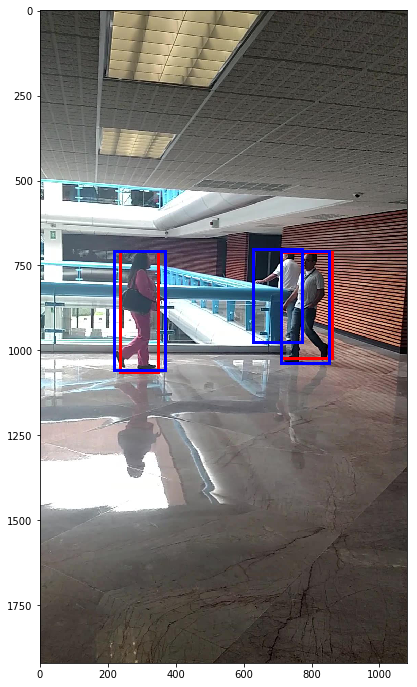

Presicion
0.894420253164557
0.7276916160935042
Boxes: 2
0.8110559346290306
Recall
0.7276916160935042
0.894420253164557
0.23882483020060022
Boxes: 3
0.6203122331528871
Number of images: 1
Presicion: 0.8111
Recall: 0.6203
F1 score: 0.703
0.7029748590836193


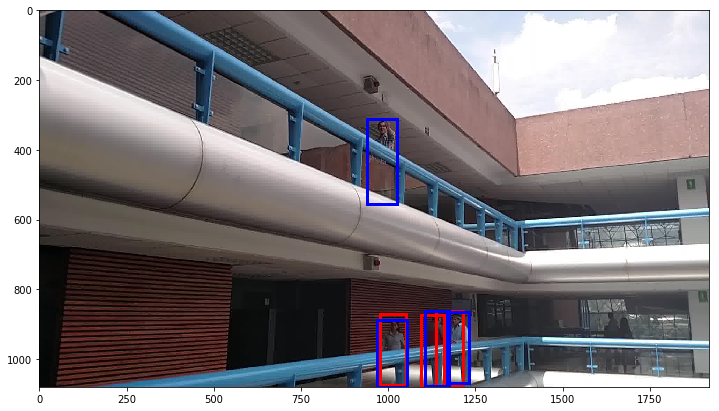

Presicion
0.47348503960845656
0.7656024029369229
0.62143022985837
Boxes: 3
0.6201725574679166
Recall
0
0.7656024029369229
0.62143022985837
0.47348503960845656
Boxes: 4
0.46512941810093744
Number of images: 1
Presicion: 0.6202
Recall: 0.4651
F1 score: 0.5316
0.5315764778296427


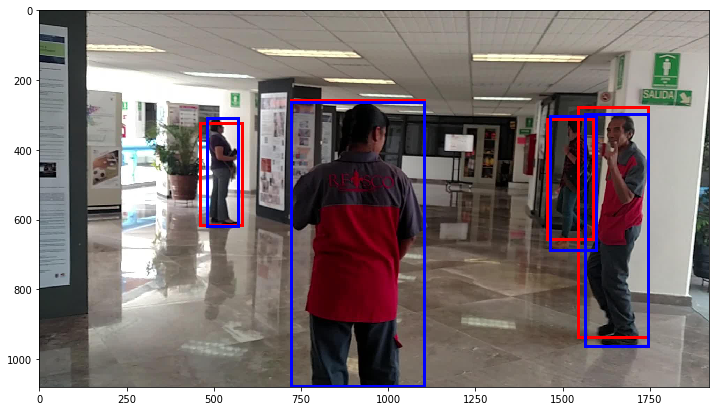

Presicion
0.9902676399026764
0.8273968837256406
0.7339520494972931
0.7964826006982244
Boxes: 4
0.8370247934559587
Recall
0.7339520494972931
0.7964826006982244
0.8273968837256406
0.9902676399026764
Boxes: 4
0.8370247934559586
Number of images: 1
Presicion: 0.837
Recall: 0.837
F1 score: 0.837
0.8370247934559586


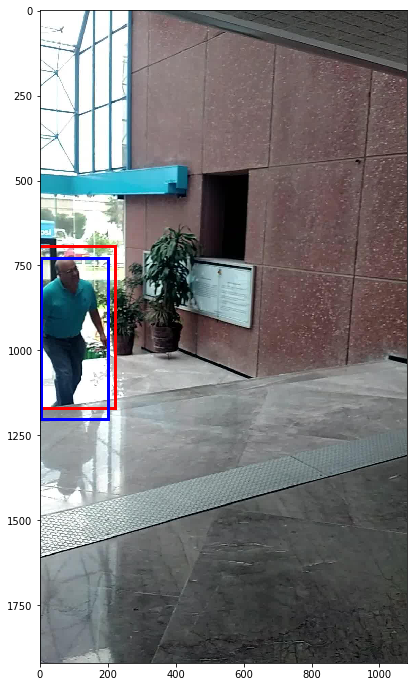

Presicion
0.7701912438754545
Boxes: 1
0.7701912438754545
Recall
0.7701912438754545
Boxes: 1
0.7701912438754545
Number of images: 1
Presicion: 0.7702
Recall: 0.7702
F1 score: 0.7702
0.7701912438754545


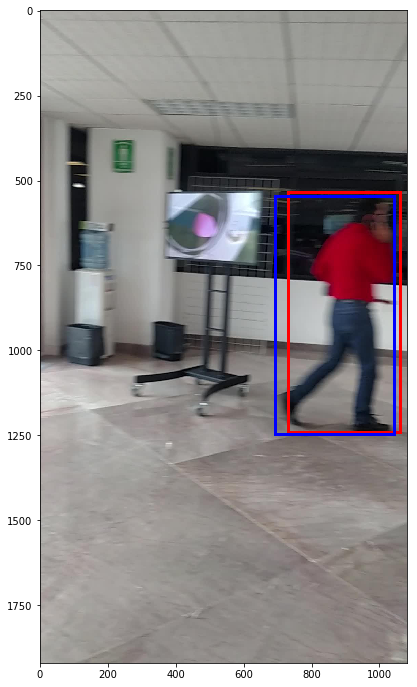

Presicion
0.8304054936360773
Boxes: 1
0.8304054936360773
Recall
0.8304054936360773
Boxes: 1
0.8304054936360773
Number of images: 1
Presicion: 0.8304
Recall: 0.8304
F1 score: 0.8304
0.8304054936360772


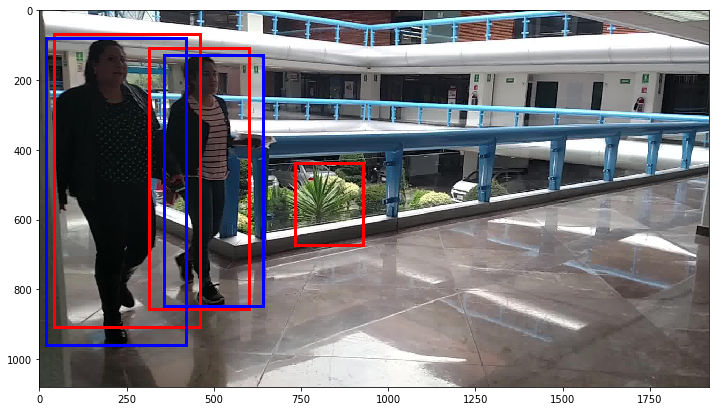

Presicion
0.8053523128761267
0.7188792047237964
0
Boxes: 3
0.5080771725333078
Recall
0.7188792047237964
0.8053523128761267
Boxes: 2
0.7621157587999616
Number of images: 1
Presicion: 0.5081
Recall: 0.7621
F1 score: 0.6097
0.6096926070399693


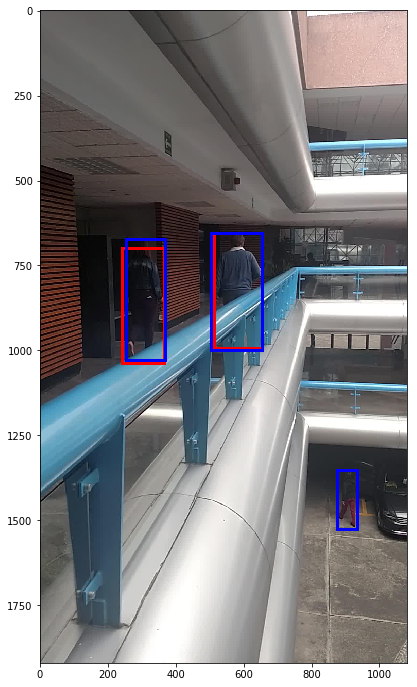

Presicion
0.93379494420053
0.8016946601002172
Boxes: 2
0.8677448021503735
Recall
0.93379494420053
0.8016946601002172
0
Boxes: 3
0.5784965347669156
Number of images: 1
Presicion: 0.8677
Recall: 0.5785
F1 score: 0.6942
0.6941958417202987


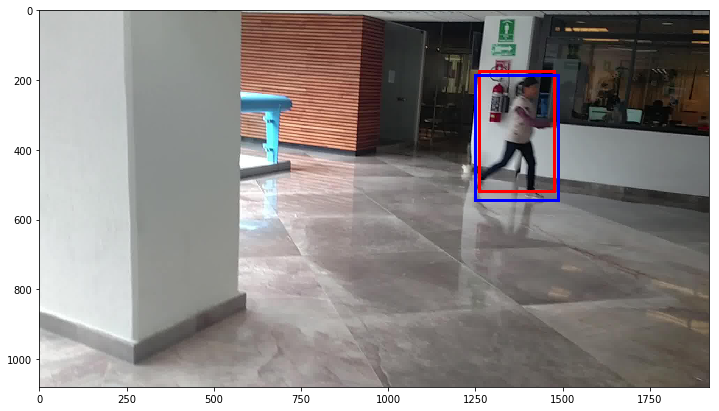

Presicion
0.8118020145329272
Boxes: 1
0.8118020145329272
Recall
0.8118020145329272
Boxes: 1
0.8118020145329272
Number of images: 1
Presicion: 0.8118
Recall: 0.8118
F1 score: 0.8118
0.8118020145329272


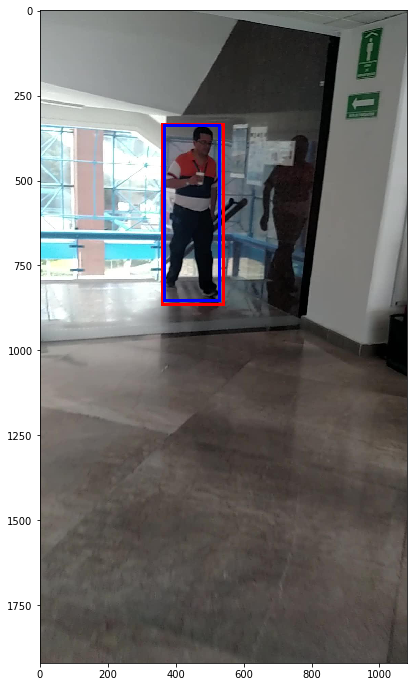

Presicion
0.864280566898871
Boxes: 1
0.864280566898871
Recall
0.864280566898871
Boxes: 1
0.864280566898871
Number of images: 1
Presicion: 0.8643
Recall: 0.8643
F1 score: 0.8643
0.864280566898871


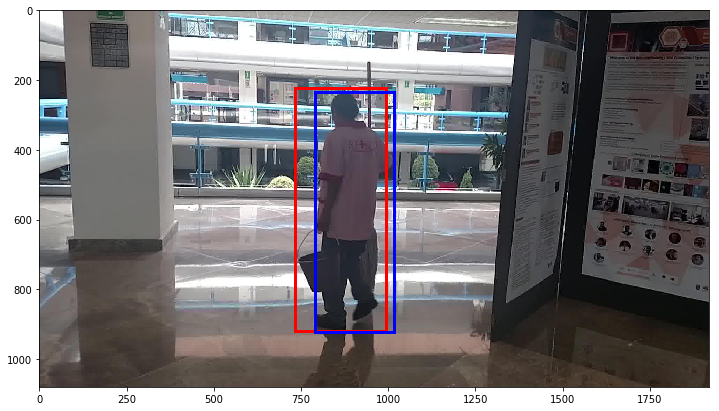

Presicion
0.7047535715902062
Boxes: 1
0.7047535715902062
Recall
0.7047535715902062
Boxes: 1
0.7047535715902062
Number of images: 1
Presicion: 0.7048
Recall: 0.7048
F1 score: 0.7048
0.7047535715902062


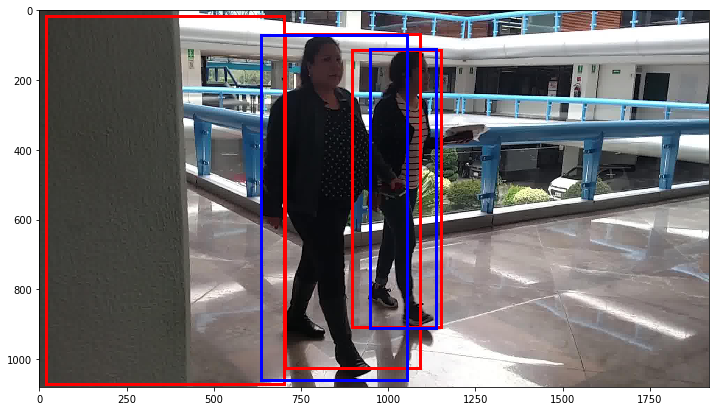

Presicion
0.742841616947167
0.7430115450749202
0.059921766858513456
Boxes: 3
0.5152583096268669
Recall
0.7430115450749202
0.742841616947167
Boxes: 2
0.7429265810110436
Number of images: 1
Presicion: 0.5153
Recall: 0.7429
F1 score: 0.6085
0.6084941842125214


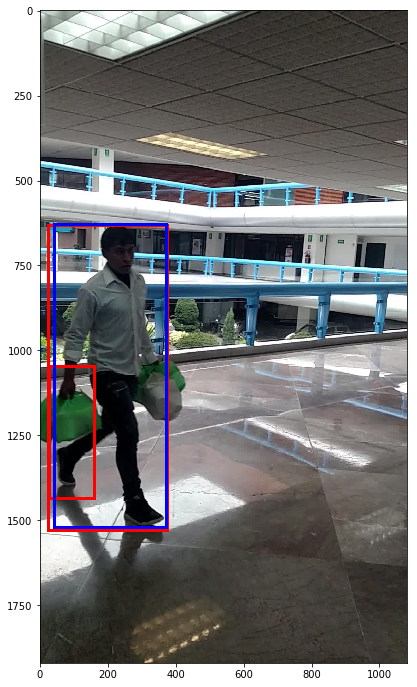

Presicion
0.920499027704119
0.15134968337447677
Boxes: 2
0.5359243555392978
Recall
0.920499027704119
Boxes: 1
0.920499027704119
Number of images: 1
Presicion: 0.5359
Recall: 0.9205
F1 score: 0.6774
0.6774374180923604


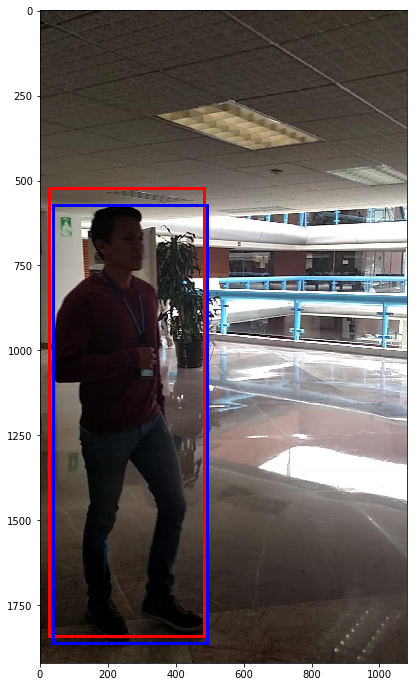

Presicion
0.9124959523920759
Boxes: 1
0.9124959523920759
Recall
0.9124959523920759
Boxes: 1
0.9124959523920759
Number of images: 1
Presicion: 0.9125
Recall: 0.9125
F1 score: 0.9125
0.9124959523920759


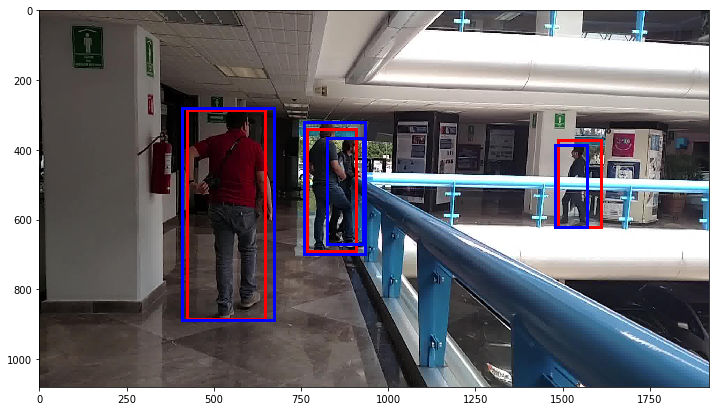

Presicion
0.8507445784496914
0.7307325220711047
0.5776734104046243
Boxes: 3
0.7197168369751402
Recall
0.8507445784496914
0.7307325220711047
0.45558283980933123
0.5776734104046243
Boxes: 4
0.6536833376836879
Number of images: 1
Presicion: 0.7197
Recall: 0.6537
F1 score: 0.6851
0.6851126319361754


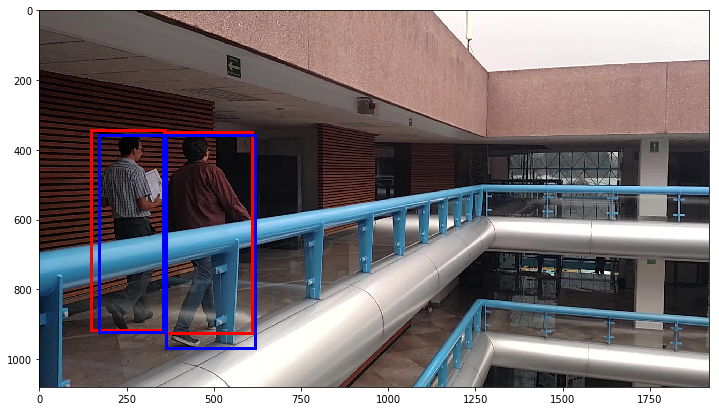

Presicion
0.8678191024969443
0.8298504053899738
Boxes: 2
0.8488347539434591
Recall
0.8678191024969443
0.8298504053899738
Boxes: 2
0.8488347539434591
Number of images: 1
Presicion: 0.8488
Recall: 0.8488
F1 score: 0.8488
0.8488347539434591


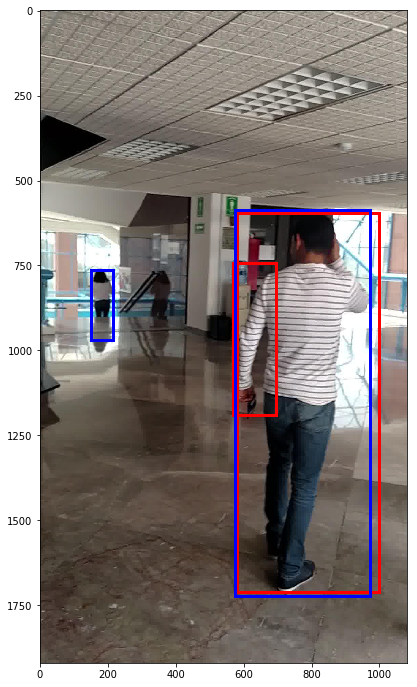

Presicion
0.9068812015060429
0.11763366003821385
Boxes: 2
0.5122574307721284
Recall
0
0.9068812015060429
Boxes: 2
0.45344060075302145
Number of images: 1
Presicion: 0.5123
Recall: 0.4534
F1 score: 0.4811
0.48105786605502454


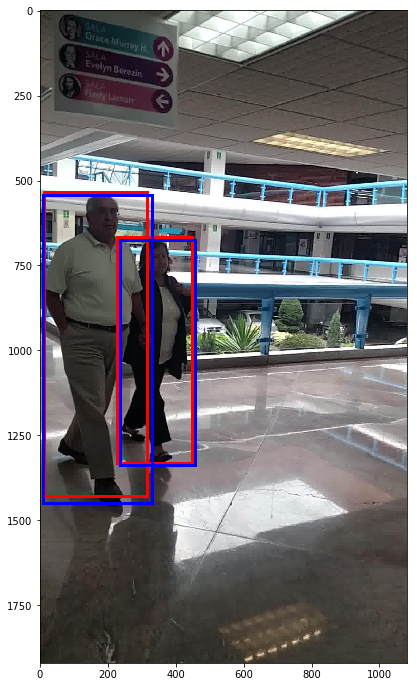

Presicion
0.9165341055865998
0.9031939627739027
Boxes: 2
0.9098640341802513
Recall
0.9031939627739027
0.9165341055865998
Boxes: 2
0.9098640341802513
Number of images: 1
Presicion: 0.9099
Recall: 0.9099
F1 score: 0.9099
0.9098640341802513


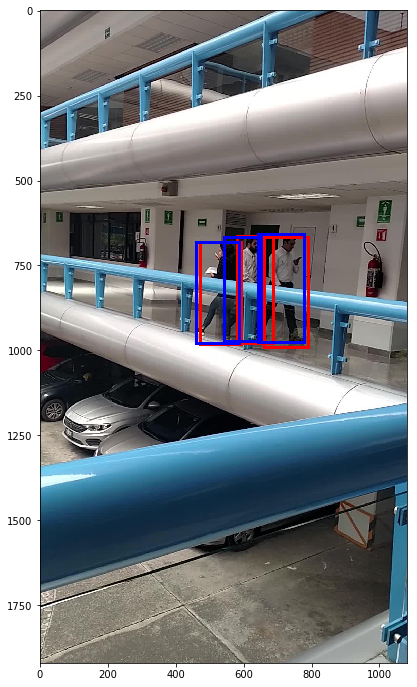

Presicion
0.7409808171450564
0.8430050384779284
0.46061617514657766
Boxes: 3
0.6815340102565207
Recall
0.7409808171450564
0.46061617514657766
0.8430050384779284
Boxes: 3
0.6815340102565207
Number of images: 1
Presicion: 0.6815
Recall: 0.6815
F1 score: 0.6815
0.6815340102565207


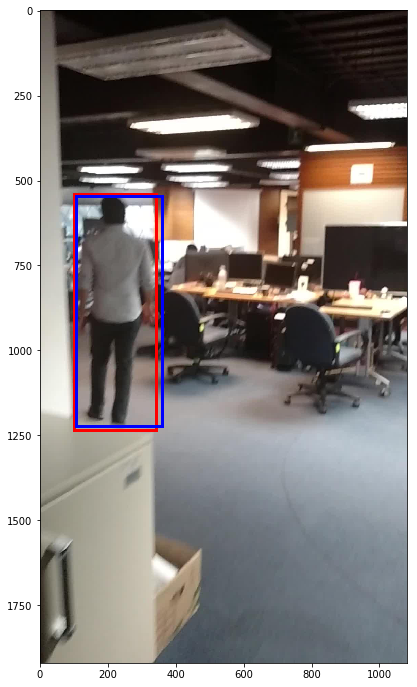

Presicion
0.8960400204140004
Boxes: 1
0.8960400204140004
Recall
0.8960400204140004
Boxes: 1
0.8960400204140004
Number of images: 1
Presicion: 0.896
Recall: 0.896
F1 score: 0.896
0.8960400204140004


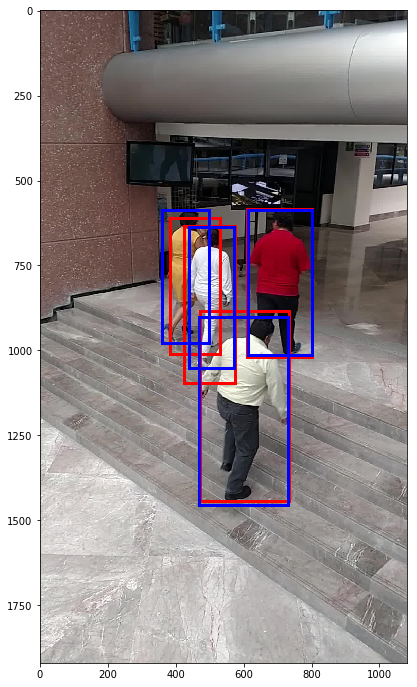

Presicion
0.9686518129144017
0.9199680239034427
0.8020390455531453
0.6024953424038841
Boxes: 4
0.8232885561937184
Recall
0.9686518129144017
0.9199680239034427
0.8020390455531453
0.6024953424038841
Boxes: 4
0.8232885561937184
Number of images: 1
Presicion: 0.8233
Recall: 0.8233
F1 score: 0.8233
0.8232885561937183


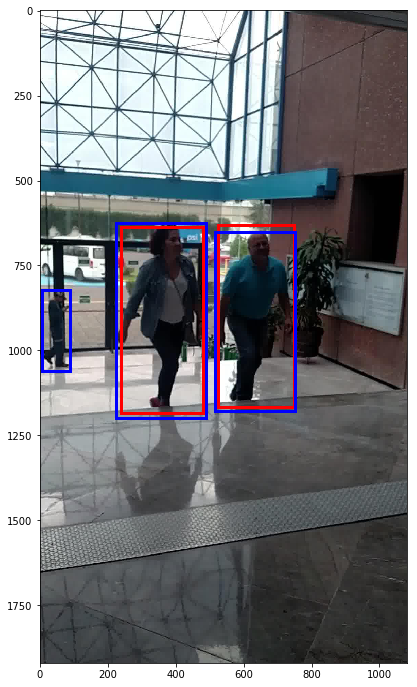

Presicion
0.8700809615662192
0.9009708135122341
Boxes: 2
0.8855258875392267
Recall
0.9009708135122341
0.8700809615662192
0
Boxes: 3
0.5903505916928178
Number of images: 1
Presicion: 0.8855
Recall: 0.5904
F1 score: 0.7084
0.7084207100313813


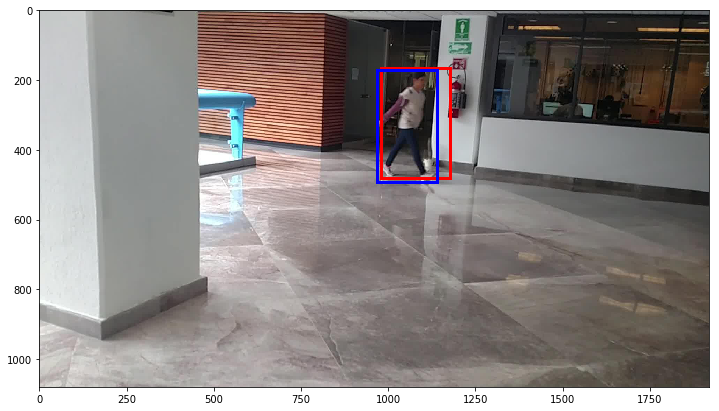

Presicion
0.7348567390088048
Boxes: 1
0.7348567390088048
Recall
0.7348567390088048
Boxes: 1
0.7348567390088048
Number of images: 1
Presicion: 0.7349
Recall: 0.7349
F1 score: 0.7349
0.7348567390088048


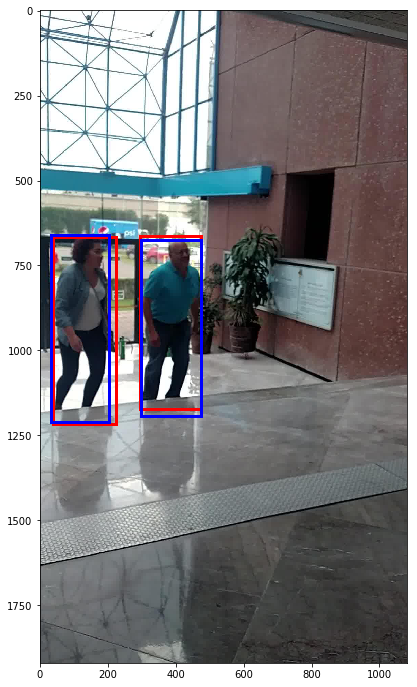

Presicion
0.8514419915453264
0.9262925598991173
Boxes: 2
0.8888672757222218
Recall
0.9262925598991173
0.8514419915453264
Boxes: 2
0.8888672757222218
Number of images: 1
Presicion: 0.8889
Recall: 0.8889
F1 score: 0.8889
0.8888672757222218


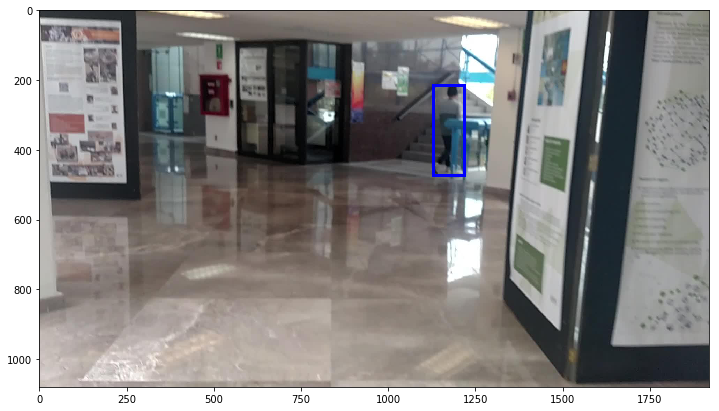

Presicion
0.0
Recall
0
Boxes: 1
0.0
Number of images: 1
Presicion: 0.0
Recall: 0.0
F1 score: 0.0
0.0


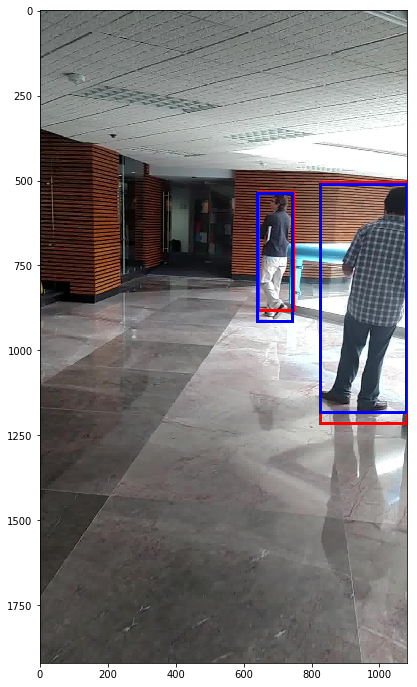

Presicion
0.932844178412821
0.8668117900215183
Boxes: 2
0.8998279842171697
Recall
0.8668117900215183
0.932844178412821
Boxes: 2
0.8998279842171697
Number of images: 1
Presicion: 0.8998
Recall: 0.8998
F1 score: 0.8998
0.8998279842171697


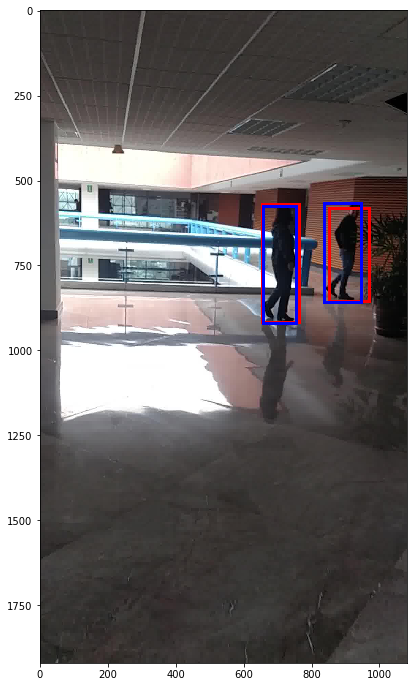

Presicion
0.6869519000797236
0.8907421535871195
Boxes: 2
0.7888470268334216
Recall
0.6869519000797236
0.8907421535871195
Boxes: 2
0.7888470268334216
Number of images: 1
Presicion: 0.7888
Recall: 0.7888
F1 score: 0.7888
0.7888470268334214


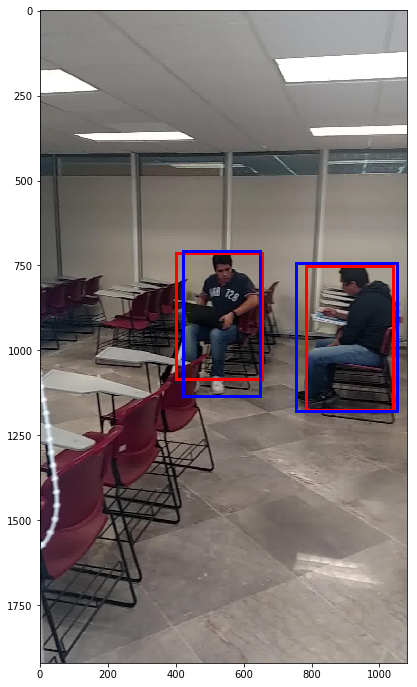

Presicion
0.7898971247691902
0.8377964863721985
Boxes: 2
0.8138468055706943
Recall
0.8377964863721985
0.7898971247691902
Boxes: 2
0.8138468055706943
Number of images: 1
Presicion: 0.8138
Recall: 0.8138
F1 score: 0.8138
0.8138468055706943


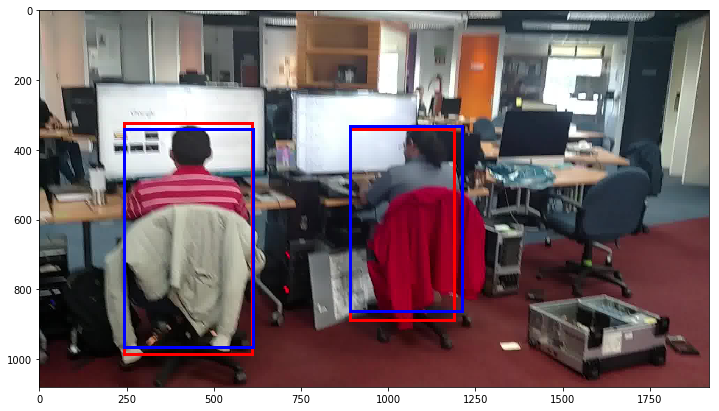

Presicion
0.9335267200522961
0.8774133819610044
Boxes: 2
0.9054700510066502
Recall
0.9335267200522961
0.8774133819610044
Boxes: 2
0.9054700510066502
Number of images: 1
Presicion: 0.9055
Recall: 0.9055
F1 score: 0.9055
0.9054700510066502


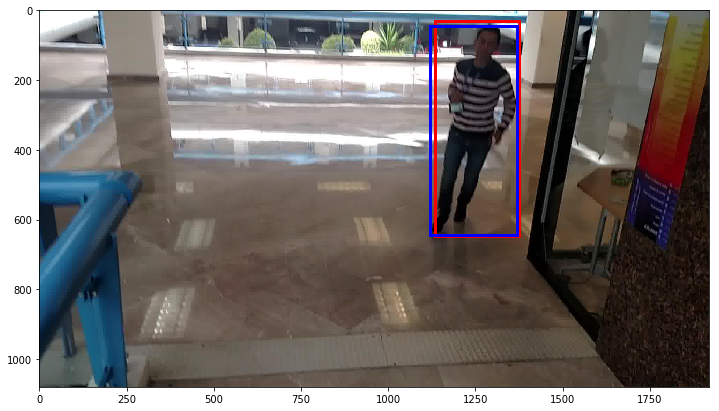

Presicion
0.8959132886538229
Boxes: 1
0.8959132886538229
Recall
0.8959132886538229
Boxes: 1
0.8959132886538229
Number of images: 1
Presicion: 0.8959
Recall: 0.8959
F1 score: 0.8959
0.8959132886538229


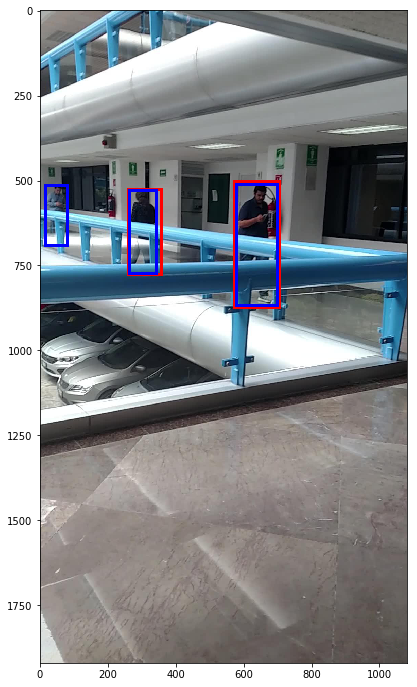

Presicion
0.8625307125307126
0.8068783068783069
Boxes: 2
0.8347045097045097
Recall
0.8625307125307126
0.8068783068783069
0
Boxes: 3
0.5564696731363398
Number of images: 1
Presicion: 0.8347
Recall: 0.5565
F1 score: 0.6678
0.6677636077636078


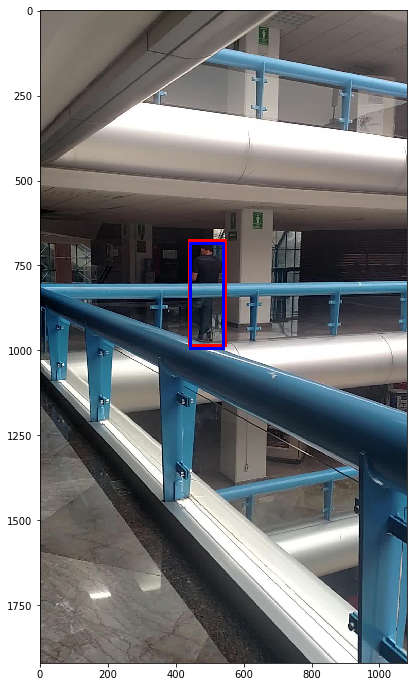

Presicion
0.8820058997050148
Boxes: 1
0.8820058997050148
Recall
0.8820058997050148
Boxes: 1
0.8820058997050148
Number of images: 1
Presicion: 0.882
Recall: 0.882
F1 score: 0.882
0.8820058997050148


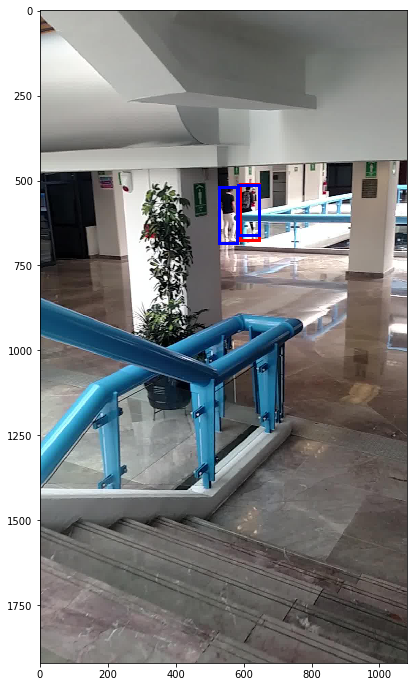

Presicion
0.8228752978554408
Boxes: 1
0.8228752978554408
Recall
0.8228752978554408
0
Boxes: 2
0.4114376489277204
Number of images: 1
Presicion: 0.8229
Recall: 0.4114
F1 score: 0.5486
0.5485835319036272


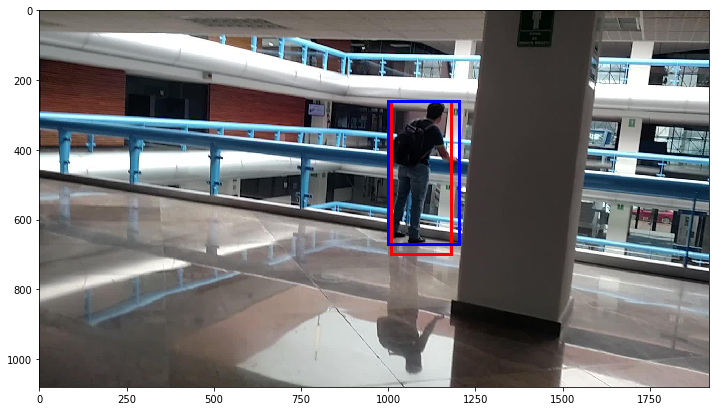

Presicion
0.802615892911884
Boxes: 1
0.802615892911884
Recall
0.802615892911884
Boxes: 1
0.802615892911884
Number of images: 1
Presicion: 0.8026
Recall: 0.8026
F1 score: 0.8026
0.802615892911884


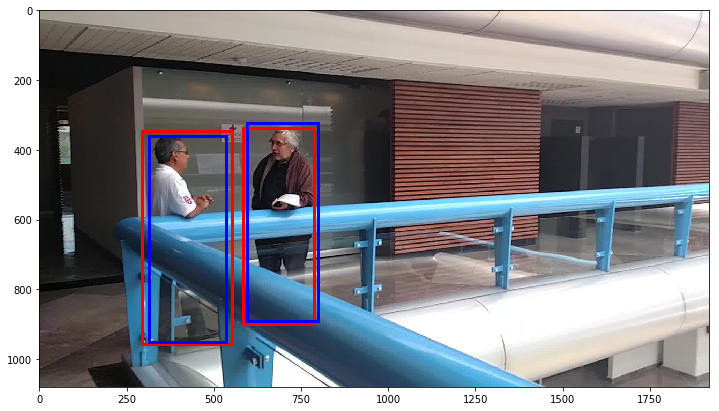

Presicion
0.8271963824289406
0.8616891562347586
Boxes: 2
0.8444427693318496
Recall
0.8616891562347586
0.8271963824289406
Boxes: 2
0.8444427693318496
Number of images: 1
Presicion: 0.8444
Recall: 0.8444
F1 score: 0.8444
0.8444427693318496


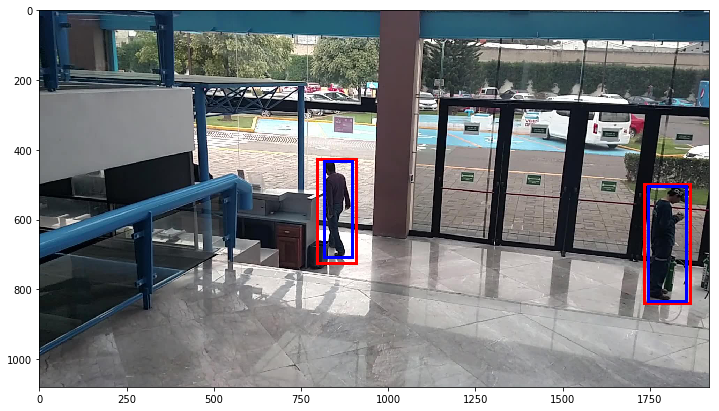

Presicion
0.6554834054834054
0.8003095975232198
Boxes: 2
0.7278965015033126
Recall
0.6554834054834054
0.8003095975232198
Boxes: 2
0.7278965015033126
Number of images: 1
Presicion: 0.7279
Recall: 0.7279
F1 score: 0.7279
0.7278965015033128


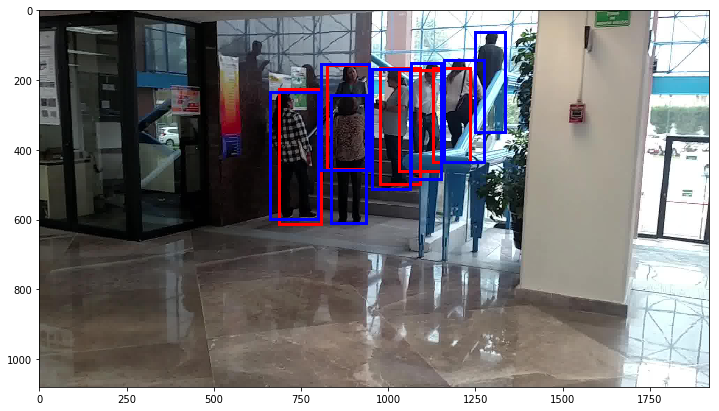

Presicion
0.6518184381167184
0.6072276782848707
0.8462141178146592
0.46648162958084394
0.7273600170700047
Boxes: 5
0.6598203761734194
Recall
0.7273600170700047
0.41857342983889795
0.6072276782848707
0.6518184381167184
0.46648162958084394
0.8462141178146592
0
Boxes: 7
0.5310964729579992
Number of images: 1
Presicion: 0.6598
Recall: 0.5311
F1 score: 0.5885
0.5885016654640567


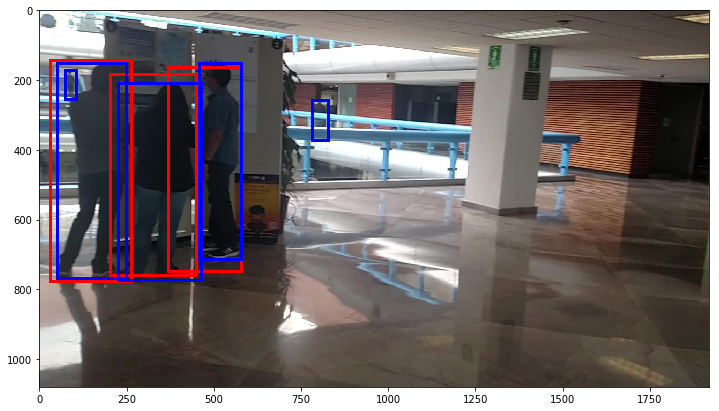

Presicion
0.7908287185465851
0.5260695563947917
0.8260710808179162
Boxes: 3
0.714323118586431
Recall
0.5260695563947917
0.7908287185465851
0.8260710808179162
0.01829763063940279
0
Boxes: 5
0.4322533972797392
Number of images: 1
Presicion: 0.7143
Recall: 0.4323
F1 score: 0.5386
0.5385922186469807


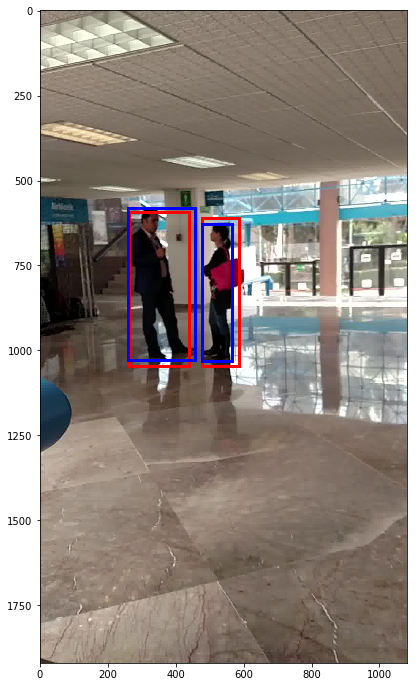

Presicion
0.8464172756025738
0.7565861459473109
Boxes: 2
0.8015017107749424
Recall
0.7565861459473109
0.8464172756025738
Boxes: 2
0.8015017107749424
Number of images: 1
Presicion: 0.8015
Recall: 0.8015
F1 score: 0.8015
0.8015017107749424


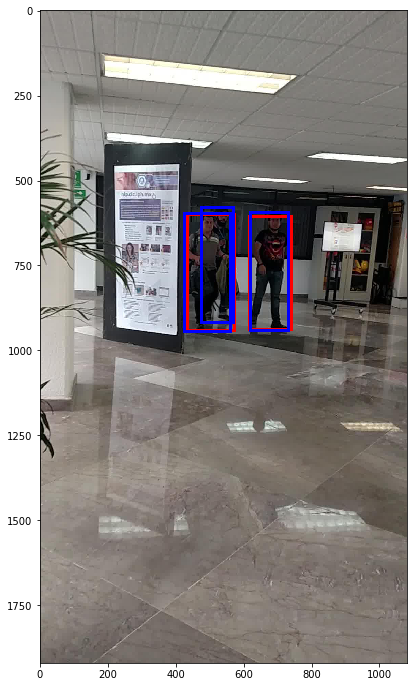

Presicion
0.8635671083614201
0.8502324854452389
Boxes: 2
0.8568997969033295
Recall
0.8635671083614201
0.8502324854452389
0.5947467166979362
Boxes: 3
0.769515436834865
Number of images: 1
Presicion: 0.8569
Recall: 0.7695
F1 score: 0.8109
0.8108601147594963


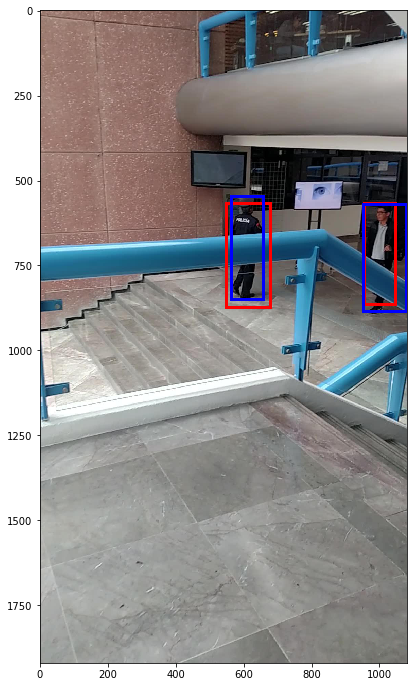

Presicion
0.6303872316900223
0.6531314521679285
Boxes: 2
0.6417593419289753
Recall
0.6303872316900223
0.6531314521679285
Boxes: 2
0.6417593419289753
Number of images: 1
Presicion: 0.6418
Recall: 0.6418
F1 score: 0.6418
0.6417593419289753


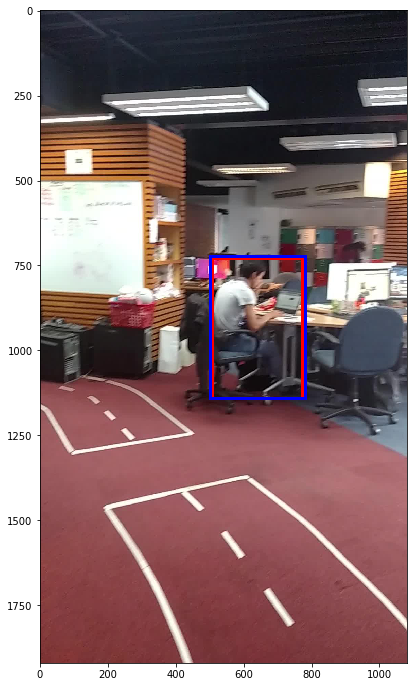

Presicion
0.9328108941418294
Boxes: 1
0.9328108941418294
Recall
0.9328108941418294
Boxes: 1
0.9328108941418294
Number of images: 1
Presicion: 0.9328
Recall: 0.9328
F1 score: 0.9328
0.9328108941418294


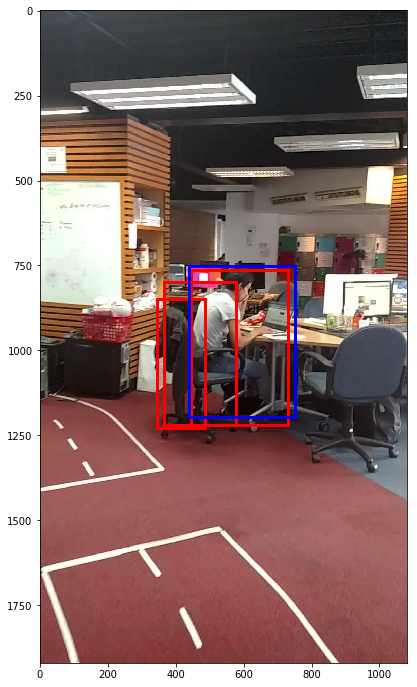

Presicion
0.8555132556330417
0.09140325232961813
0.3194556204737081
Boxes: 3
0.4221240428121226
Recall
0.8555132556330417
Boxes: 1
0.8555132556330417
Number of images: 1
Presicion: 0.4221
Recall: 0.8555
F1 score: 0.5653
0.5653133554987244


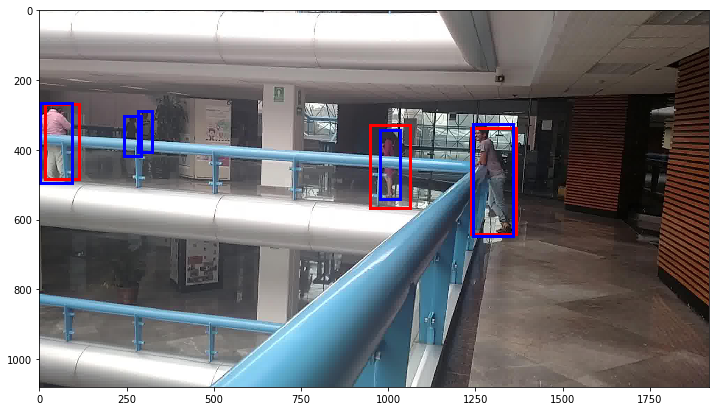

Presicion
0.4288114708188641
0.8629653244396488
0.6497783407219759
Boxes: 3
0.6471850453268296
Recall
0
0
0.6497783407219759
0.8629653244396488
0.4288114708188641
Boxes: 5
0.3883110271960978
Number of images: 1
Presicion: 0.6472
Recall: 0.3883
F1 score: 0.4854
0.48538878399512225


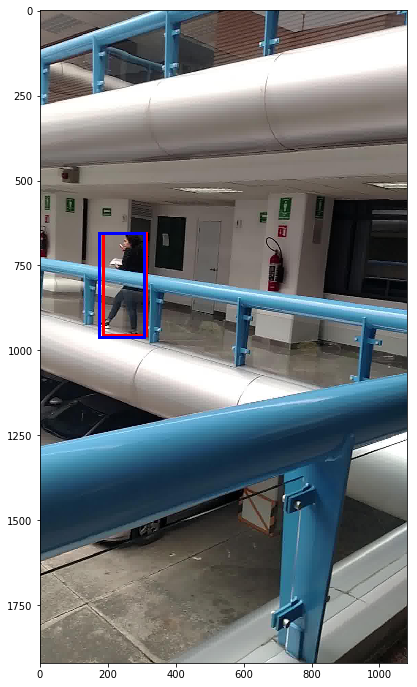

Presicion
0.8560202076901487
Boxes: 1
0.8560202076901487
Recall
0.8560202076901487
Boxes: 1
0.8560202076901487
Number of images: 1
Presicion: 0.856
Recall: 0.856
F1 score: 0.856
0.8560202076901487


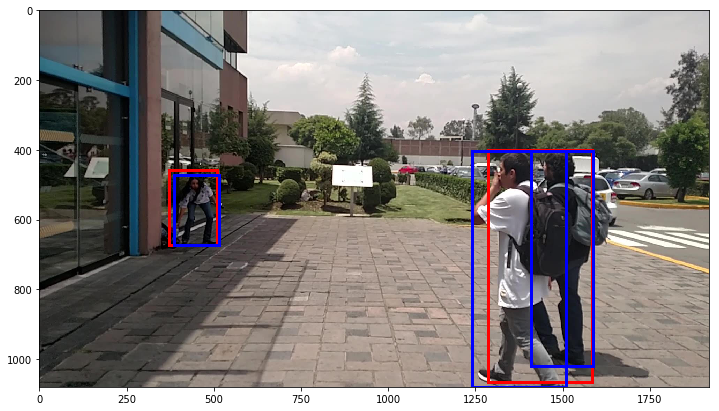

Presicion
0.6333648433807416
0.7921429721461922
Boxes: 2
0.7127539077634669
Recall
0.7921429721461922
0.6333648433807416
0.5420998858104453
Boxes: 3
0.6558692337791264
Number of images: 1
Presicion: 0.7128
Recall: 0.6559
F1 score: 0.6831
0.6831294096503553


Number of images: 45
Presicion: 0.7452
Recall: 0.6785
F1 score: 0.7102
F1 without threshold (0.7451533191410833, 0.6784700675347848, 0.7102499544376017)
Number of images: 45
Presicion: 0.8876
Recall: 0.81
F1 score: 0.847
F1 with threshold: (0.8876404494382022, 0.81, 0.8470448077304917)
Average F1: 0.7309842818678495


In [49]:
from scipy import misc
import matplotlib.pyplot as plt
import time

sum_time = 0

global_pred = []
global_ground = []
sum_performance = 0

for name_img in img_names:
    # Read image
    image = misc.imread('../data-cic/preprocess_data/img_test/' + name_img)
        
    height = image.shape[0]
    width = image.shape[1]
    
    image_test = misc.imresize(image, size=(320,320))
    image_test = image_test.reshape(1, 320, 320, 3)

    #start = time.time()
    predictions = get_prediction(model, image_test)
    predictions = helper.normilize_to_pixel(predictions, width, height)
    
    global_pred.append(predictions[0])
    
    #end = time.time()
    #sum_time += (end - start)
    ground_truth = []
    for value in ground_truth_dict[name_img]:
        label = value['shape_attributes']
        ground_truth.append([label['x'], label['y'], label['width'], label['height']])
        
    global_ground.append(ground_truth)
    
    #image_test = image_test.reshape(320, 320, 3)
    helper.show_image_bb_2(image, predictions[0], ground_truth)
    
#print('average time:', sum_time / len(img_names))
    print('Presicion')
    print(cal_precision(predictions, [ground_truth]))   
    print('Recall')
    print(cal_precision([ground_truth], predictions))
    
    _, _, performance = helper.cal_performance([ground_truth], predictions)
    sum_performance += performance
    print(performance)
    
print('\n')
print('F1 without threshold', helper.cal_performance(global_ground, global_pred))
print('F1 with threshold:', helper.cal_performance(global_ground, global_pred, True, 0.5))
print('Average F1:', sum_performance / len(img_names))